# Vehicle Detection & Tracking Project
## Udacity Self-Driving Car Nanodegree (Term 1 - Assignment 5)

### By Munir Jojo-Verge
---

### Goals
The goals / steps of this project are the following:

* Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
* Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector.
* Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
* Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicles detected.

---

## Histogram of Oriented Gradients (HOG)

### 1. Data Exploration
Throughout the rest of this assignement, I'll use a relatively small labeled dataset to try out feature extraction and training a classifier. This data was provided by Udacity and is devided into "vehicle" and "non-vehicle" image sets. These datasets are comprised of images taken from the GTI vehicle image database, the KITTI vision benchmark suite, and examples extracted from the project video itself. I will also explore the recently released Udacity labeled dataset (3.3Gb). Each of the Udacity datasets comes with a "labels.csv" file that gives bounding box corners for each object labeled, which might be very helpful.

The "vehicle" set is organized as follow:

__/vehicle__
    - /GTI_Far
    - /GTI_Left
    - /GTI_MiddleClose
    - /GTI_Right
    - /KITTI_extracted

And the "non-vehicle" set is organized as follow:

__/non-vehicle__
    - /Extras
    - /GTI
The folders' names are pretty descriptive as for what type of images they contain. All images on both datasets are __64x64 with 3 color channels__.

<figure>
 <img src="car-not-car-examples.jpg" width="600" alt="Combined Image" />
 <figcaption>
</figure>
 <p></p>
  _______________________

__ I will use the following cell to import all the libraries I will need. I will add them here as I progress.__

Sometimes is better to keep the "import" of the libraries needed to run each cell on the cell itself to make sure that they can run independently and also for clarity (to know what libraries you need to run each part), but for the sake of "cleaning-ness" and to make slighly easier the review process I will collect all libraries in this first cell

In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC, SVC
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.cross_validation import train_test_split
from sklearn.externals import joblib
from skimage.feature import hog
import time

import os
import pickle
%matplotlib qt

from scipy.signal import find_peaks_cwt
%matplotlib inline

C:\Program Files\Miniconda3\envs\carnd-term1\lib\site-packages\sklearn\cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [2]:
def LoadImagesPaths(pathList):
    ImagePathArray = []            
    for path in pathList:
        #print("Loading images from:", path)
        images = glob.glob(path)
        for image in images:                
            ImagePathArray.append(image)                
    return ImagePathArray

### 2. scikit-image HOG

In [9]:
##__________________________________________________________________________
##  LOAD IMAGES' PATHS
##__________________________________________________________________________

# Define where are all the training/testing images we will use
Car_images = ['vehicles/GTI_Far/*.png',
              'vehicles/GTI_Left/*.png',
              'vehicles/GTI_MiddleClose/*.png',
              'vehicles/GTI_Right/*.png',
              'vehicles/KITTI_extracted/*.png'                      
             ]

NonCar_images = ['non-vehicles/Extras/*.png',
                 'non-vehicles/GTI/*.png'

                ]
# LOAD Car_images
cars = LoadImagesPaths(Car_images)
print('Car images loaded:',len(cars))

# LOAD NonCar_images
notcars = LoadImagesPaths(NonCar_images)
print('Non-Car images loaded:',len(notcars))
    

Car images loaded: 8792
Non-Car images loaded: 8968


In [39]:
##__________________________________________________________________________
##     HOG FEATURES' EXTRACTION FUNCTION
##__________________________________________________________________________

# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=False):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

##__________________________________________________________________________
##     SPATIAL BINNING
##__________________________________________________________________________

# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

##__________________________________________________________________________
##     COLOR HISTOGRAMS EXTRACTION FUNCTION
##__________________________________________________________________________

# Define a function to compute color histogram features 
# NEED TO CHANGE bins_range if reading .png files with mpimg!
def color_hist(img, nbins=32, bins_range=(0, 256), visualOut=False):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    if visualOut:
        # Generating bin centers for
        bin_edges = channel1_hist[1]
        bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])/2

        # Return the individual histograms, bin_centers and feature vector
        return channel1_hist, channel2_hist, channel3_hist, bin_centers, hist_features
    else:
        # Return the just feature vector
        return hist_features


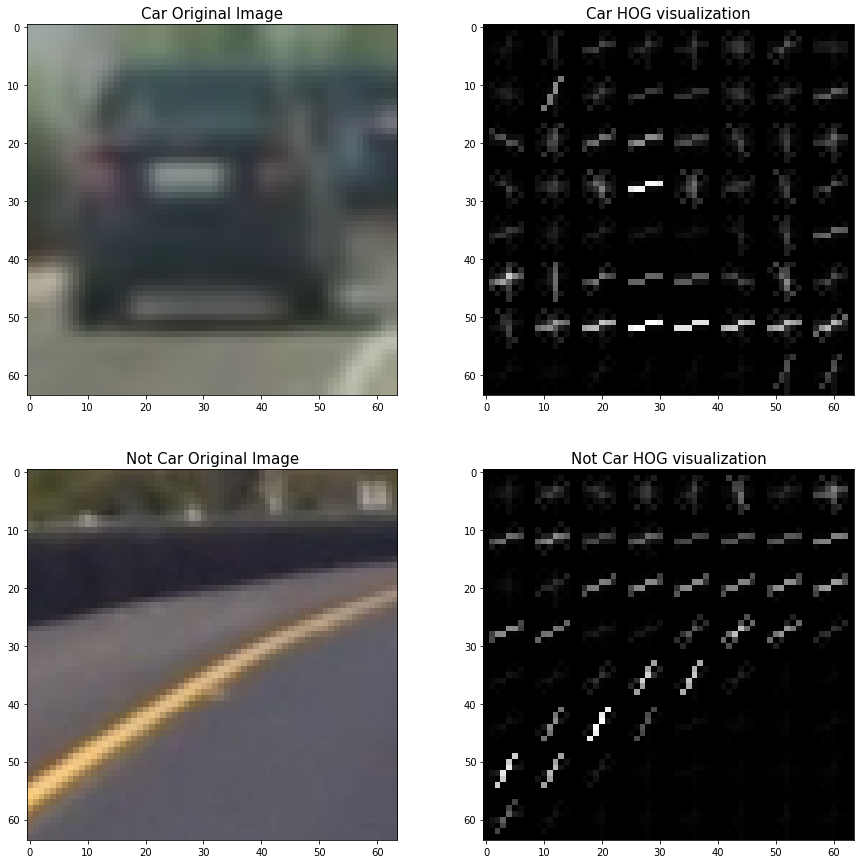

In [40]:
##__________________________________________________________________________
##     TEST HOG FEATURES' EXTRACTION
##__________________________________________________________________________

# Define HOG parameters to tune
orient = 9
pix_per_cell = 8
cell_per_block = 2

# Generate a random index to look at a car image
ind = np.random.randint(0, len(cars))
# Read in the image
CarImage = cv2.cvtColor(cv2.imread(cars[ind]), cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(CarImage, cv2.COLOR_RGB2GRAY)

# Call our function with vis=True to see an image output
features, hog_image_Car = get_hog_features(gray, orient, 
                        pix_per_cell, cell_per_block, 
                        vis=True, feature_vec=False)

## Let's do the same for NON-CARS

# Generate a random index to look at a car image
ind = np.random.randint(0, len(notcars))
# Read in the image
NotCarImage = cv2.cvtColor(cv2.imread(notcars[ind]), cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(NotCarImage, cv2.COLOR_RGB2GRAY)

# Call our function with vis=True to see an image output
features, hog_image_NotCar = get_hog_features(gray, orient, 
                        pix_per_cell, cell_per_block, 
                        vis=True, feature_vec=False)

# Visualize the work
f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2,figsize=(15,15))
ax1.imshow(CarImage)
ax1.set_title('Car Original Image', fontsize=15)

ax2.imshow(hog_image_Car, cmap='gray')
ax2.set_title('Car HOG visualization', fontsize=15) 

ax3.imshow(NotCarImage)
ax3.set_title('Not Car Original Image', fontsize=15)

ax4.imshow(hog_image_NotCar, cmap='gray')
ax4.set_title('Not Car HOG visualization', fontsize=15) 


Car Color Histogram


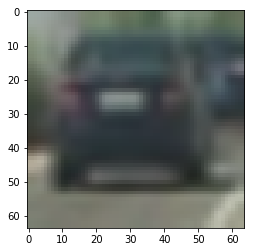

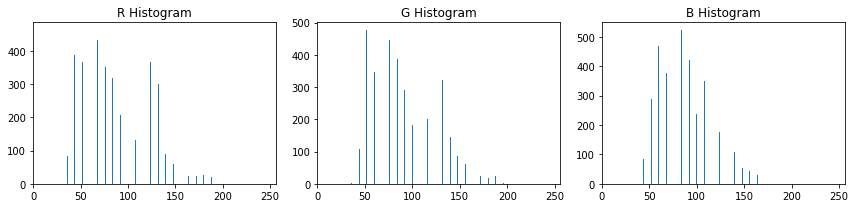

In [41]:
##__________________________________________________________________________
##     TEST COLOR HISTOGRAM
##__________________________________________________________________________

# LEST'S START WITH A CAR IMAGE

rh, gh, bh, bincen, feature_vec = color_hist(CarImage, nbins=32, bins_range=(0, 256), visualOut=True)

# Plot a figure with all three bar charts
if rh is not None:
    print('Car Color Histogram')    
    plt.imshow(CarImage)    
    fig = plt.figure(figsize=(12,3))
    plt.subplot(131)
    plt.bar(bincen, rh[0])
    plt.xlim(0, 256)
    plt.title('R Histogram')
    plt.subplot(132)
    plt.bar(bincen, gh[0])
    plt.xlim(0, 256)
    plt.title('G Histogram')
    plt.subplot(133)
    plt.bar(bincen, bh[0])
    plt.xlim(0, 256)
    plt.title('B Histogram')
    fig.tight_layout()
else:
    print('Your function is returning None for at least one variable...')

Not-Car Color Histogram


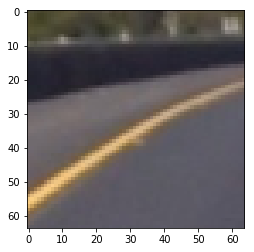

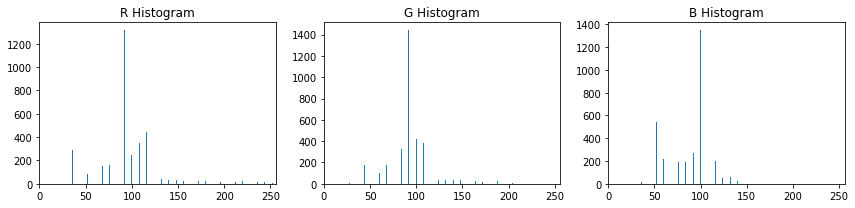

In [42]:
# LEST'S NOW DO A NOT-CAR IMAGE and Compare visially how the historgrams might be used to differenciate them
# This example is usisng RGB but below we will explore interactively different color spaces 

rh, gh, bh, bincen, feature_vec = color_hist(NotCarImage, nbins=32, bins_range=(0, 256), visualOut=True)

# Plot a figure with all three bar charts
if rh is not None:
    print('Not-Car Color Histogram')    
    plt.imshow(NotCarImage)    
    fig = plt.figure(figsize=(12,3))
    plt.subplot(131)
    plt.bar(bincen, rh[0])
    plt.xlim(0, 256)
    plt.title('R Histogram')
    plt.subplot(132)
    plt.bar(bincen, gh[0])
    plt.xlim(0, 256)
    plt.title('G Histogram')
    plt.subplot(133)
    plt.bar(bincen, bh[0])
    plt.xlim(0, 256)
    plt.title('B Histogram')
    fig.tight_layout()
else:
    print('Your function is returning None for at least one variable...')

### 3. Combine and Normalize Features

Since the dataset is has almost 19K images, I will choose just 10 images from each folder for test purposes since. 

In [43]:
# This cell is just for testing and reduce the Debugging time by reducing the training/testing number of images
Debugging = True
if (Debugging):
    sample_size = 10
    cars = cars[0:sample_size]
    notcars = notcars[0:sample_size]

print('Car images loaded:',len(cars))
print('Not-Car images loaded:',len(notcars))

Car images loaded: 10
Not-Car images loaded: 10


In [49]:
##__________________________________________________________________________
##     COMBINE ALL FEATURE EXTRACTION FUNTIONS 
##__________________________________________________________________________

# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel='ALL',
                        spatial_feat=True, hist_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        #image = mpimg.imread(file)
        image = cv2.cvtColor(cv2.imread(file), cv2.COLOR_BGR2RGB)
        
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if (hog_channel != 'None'):
            hog_features = []
            if hog_channel == 'ALL':            
                # Compute individual channel HOG features for the entire image
                hog1 = get_hog_features(feature_image[:,:,0], orient, pix_per_cell, cell_per_block, vis=False, feature_vec=False)
                hog2 = get_hog_features(feature_image[:,:,1], orient, pix_per_cell, cell_per_block, vis=False, feature_vec=False)
                hog3 = get_hog_features(feature_image[:,:,2], orient, pix_per_cell, cell_per_block, vis=False, feature_vec=False)
                hog_features = np.hstack((hog1.ravel(), hog2.ravel(), hog3.ravel()))
            elif hog_channel == 'AVG':        
                gray = np.mean(feature_image,2).astype(np.float32)/255                                             
                hog_features = get_hog_features(gray, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=False)    
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                                                pix_per_cell, cell_per_block, vis=False, feature_vec=False)
            #Append features to list            
            file_features.append(hog_features)
            
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

def PlotExample(X, scaled_X,PathList, ImageIdx):    
    # Plot an example of raw and scaled features
    fig = plt.figure(figsize=(12,4))
    plt.subplot(131)
    plt.imshow(mpimg.imread(PathList[ImageIdx]))
    plt.title('Original Image')
    plt.subplot(132)
    plt.plot(X[ImageIdx])
    plt.title('Raw Features')
    plt.subplot(133)
    plt.plot(scaled_X[ImageIdx])
    plt.title('Normalized Features')
    fig.tight_layout()

__ Let's try this interactivly so we can explore different color spaces and different skimage.hog() parameters (orientations, pixels_per_cell, and cells_per_block). As you can see above I just loaded a small sample of the images and i didn't forget to Normalize (scale) the feature vectors (PlotExample). I grabbed a random image from each of the two classes and displayed them to get a feel for what the skimage.hog() output looks like.
Let's see how it looks.__

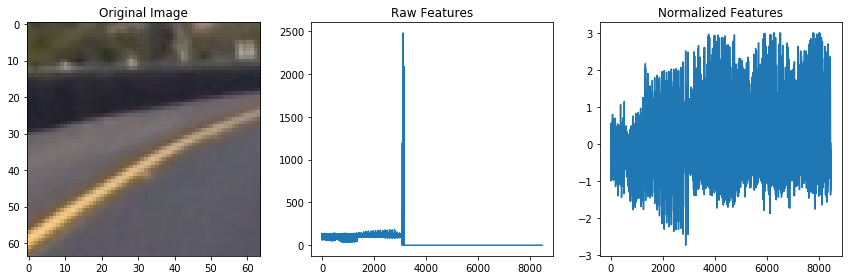

In [51]:
from ipywidgets import widgets, interactive, FloatSlider, IntSlider, IntRangeSlider, FloatRangeSlider, RadioButtons, Select, Checkbox
                
def extract_features_interactive(Images, ImageIdx = 0, cspace='RGB', spatial_size=32,
                                 hist_bins=32, orient=9, 
                                 pix_per_cell=8, cell_per_block=2, hog_channel='ALL'):
    if Images == "Cars":
        imagePathList = cars
    else:
        imagePathList = notcars
        
    features = extract_features(imagePathList, cspace, (spatial_size,spatial_size),                                                 
                                hist_bins, orient, pix_per_cell, cell_per_block, hog_channel)
    if len(features) > 0:    
        # Create an array stack of feature vectors
        X = features   
        # Fit a per-column scaler
        X_scaler = StandardScaler().fit(X)
        # Apply the scaler to X
        scaled_X = X_scaler.transform(X)        
        
        PlotExample(X, scaled_X, imagePathList, ImageIdx)
    else: 
        print('Not all images had features extracted! Something went wrong. You should investigate this')


interactive(extract_features_interactive,
            Images = RadioButtons(
                    options=['Cars', 'Non-Cars'],
                    value='Cars',
                    description='Images:',
                    disabled=False
            ),
            ImageIdx = IntSlider(min=1, max=10-1, step=1, value=1),
            cspace = Select(
            options = ['RGB', 'HSV', 'LUV', 'HLS', 'YUV','YCrCb'],
            value = 'YUV',
            description = 'Color Space:'),
            spatial_size = IntSlider(min=1, max=64, step=1,value=32),
            orient = IntSlider(min=0, max=20, step=1,value=9),
            pix_per_cell = IntSlider(min=0, max=32, step=1,value=8),
            cell_per_block = IntSlider(min=0, max=10, step=1,value=2),
            hist_bins = IntSlider(min=0, max=255, step=1,value=32),
            hist_range_min = IntSlider(min=0, max=256, step=1,value=0),
            hist_range_max = IntSlider(min=0, max=256, step=1,value=256),
            hog_channel = Select(
            options = ['None', 'ALL', 'AVG', 0, 1, 2],
            value = 'ALL',
            description = 'HOG Feature (Channel)'))

__ So far I've shown that I can extract features from an image using and combining different techniques such as:__ 
* Look at histograms of pixel intensity (color histograms) as features.
* Investigate the above mentioned Color histograms in different "Color Spaces"
* Spatial binning: A form of quantization. Statistical data binning is a way to group a number of more or less continuous values into a smaller number of "bins". In our case, we "resize"
* Histogram of Oriented Gradient (HOG) to better capture shape features. 

But we don't have (yet) a way to quantify how good or bad this feature extraction is or how to tune the feature extraction parameters we've seen so far to get a better "extraction". The only way to quantify this extraction and to be able to tune its parameters is to build a "Classifier” and compare their accuracies using different set of features that come from tuning the “extraction” process.
Let’s start by identifying the different parameters we have so far and build a table that will try to test the accuracy of the classifier while using a different combination of them.
* Color Space: options = ['RGB', 'HSV', 'LUV', 'HLS', 'YUV', 'YCrCb']
* HOG Feature: options = None (don't use it), AVG (Average all 3 channels to create a "gray" image) or use specific Channel (0,1,2)
* Orientation: options = Depending on how sensitive we want to be in detecting gradients. I’ll start with the default value (9) that has also been recommended in the lectures (“you typically won’t need any more accuracy at this small scale”). I’ll start by keeping this value constant unless I see that the Classifier accuracy is unacceptable and needs tuning somewhere else.
* Pix per Cell: As the case above, I’ll start using the recommended value (8) and only adjust if the classifier low accuracy requires it.
* Cell per Block: same as above (default value 2).

For simplicity I will use the same classifier to test the different combinations for feature extraction and if time permits I will test the same combinations with a different classifier (Gaussian Naive Bayes, Decission Trees, CNN or SVN) and compare both best results. I will start with an SVN classifier (Reasons why bellow)
I'm also aware that to successfully tune my SVN classifier it involves searching for a kernel, a gamma value and a C value that minimize prediction error. To tune my SVM vehicle detection model, I will use scikit-learn's parameter tuning algorithms as it's been suggested in the lectures.

I will try to setup the classifier and an "Interactive" testing process like I did before and populate a table with the results. If this task proves to be very difficult to perform on a "notebook" I will move to python files.

### The Process:
* 1 Load Images
* 2 Interactively do:
*   2.1 Extract Features (using the interactive tool to vary the parameters as we saw above)
*   2.2 Feed the features to the Classifier (Randomize and split Train and Test data) __ This step it's a challenge in itself since we need to "define and setup" our classifier.__
*   2.3 Get the accuracy of the Classifier with this extraction features
*   2.4 Save/Record the results
* 3 Repeat step 2 with a different set of feature extraction parameters
* 4 Build a table and choose the successful feature extraction parameters based on the classifier performance (mainly accuracy and not so much execution time)
* 5 If time permits try different Classifiers and repeat steps 2, 3 and 4.


In [52]:
import time
# Let's load ALL the images
# Read in our vehicles and non-vehicles
Car_images = ['vehicles/GTI_Far/*.png',
              'vehicles/GTI_Left/*.png',
              'vehicles/GTI_MiddleClose/*.png',
              'vehicles/GTI_Right/*.png',
              'vehicles/KITTI_extracted/*.png'                      
             ]

NonCar_images = ['non-vehicles/Extras/*.png',
                 'non-vehicles/GTI/*.png'

                ]
print('Loading Dataset. Please, be patient...')

t1 = time.time()
# LOAD Car_images
cars = LoadImagesPaths(Car_images)
print('Car images loaded:',len(cars))

# LOAD NonCar_images
notcars = LoadImagesPaths(NonCar_images)
print('Non-Car images loaded:',len(notcars))

t2 = time.time()
print('Seconds Loading Entire Dataset:',t2-t1)

Loading Dataset. Please, be patient...
Car images loaded: 8792
Non-Car images loaded: 8968
Seconds Loading Entire Dataset: 0.09200000762939453


 __Before continuing and move on to step 2, Let's define Our Classifier.__
 I will start with an SVN, but why??
 * On my disadvantage I have to say that after a quick search, I'm inclined to use SVN simply by following the "status-quo", the "trend" if you wish. But I'm conscious about the fact that I need more robust reasons to select one type of classifier over the others.
* From the lectures and literature we know that:

    * Strengths 
        * – Training is relatively easy 
            * • No local optimal, unlike in neural networks 
        * – It scales relatively well to high dimensional data 
        * – Tradeoff between classifier complexity and error can be controlled explicitly 
        * – Non-traditional data like strings and trees can be used as input to SVM, instead of feature vectors
        
    * Weaknesses 
        * – Need a “good” kernel function: "Perhaps the biggest limitation of the support vector approach lies in choice of the kernel." Burgess (1998)
        * - "A second limitation is speed and size, both in training and testing." Burgess (1998)
        * - "...the optimal design for multiclass SVM classifiers is a further area for research." Burgess (1998)
        * - "Although SVMs have good generalization performance, they can be abysmally slow in test phase, a problem addressed in (Burges, 1996; Osuna and Girosi, 1998)." Burgess (1998)
        * - "Besides the advantages of SVMs - from a practical point of view - they have some drawbacks. An important practical question that is not entirely solved, is the selection of the kernel function parameters - for Gaussian kernels the width parameter [sigma] - and the value of [epsilon] in the [epsilon]-insensitive loss function...[more]" Horváth (2003) in Suykens et al.
        *- "However, from a practical point of view perhaps the most serious problem with SVMs is the high algorithmic complexity and extensive memory requirements of the required quadratic programming in large-scale tasks." Horváth (2003) in Suykens et al. p 392.
        
__ And the list can keep going on. __

__The strengths listed above seem to bring strong enough justifications to start with SVN in our case, althoug, and according to the lectures, SVNs don't work well with large datasets and with lots and lots of noise, where the classes overlap each other. At this point I'm not sure what "a large dataset" might be (How large is "large"? 20k, 20 million??) and also, at this point it's a hard to quatify the "ovelaping" of the examples we've seen above since we have many HOG and color space parameters that will lead to a different set of features.__

For instance, let's see (below) what a car and a Not-Car extrated features look and how much they overlap when using the following set of feature extraction parameters (HLS, Spatial size=32x32, Hist.Bins=32, HOG grad Orientation=9, pix per cell=8, cells per block=2, Use the all color Channles for HOG extraction). If we look at the peaks on both normilized graphs, we might have a general idea that there might NOT be too much overlaping on each of the bins and that is good news if we want to use SVM, but we will have to explore this deeply.

<figure>
 <img src="Car.png" width="600" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Car - HOG Features </p> 
 </figcaption>
</figure>
 <p></p>
 _______________________
 <figure>
 <img src="NonCar.png" width="600" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> NotCar - HOG Features </p> 
 </figcaption>
</figure>
 <p></p>
 _______________________

In [19]:
# Remember that we already loaded the data and stored it on cars and notcars (those are paths to the images, not the images themselves)
from sklearn import svm
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.externals import joblib

from skimage.feature import hog
import pandas as pd
from IPython.display import display


def SVNSelection(cspace='RGB', spatial_size=32,
                 hist_bins=32, hist_range_min=0, hist_range_max=256, orient=9,
                 pix_per_cell=8, cell_per_block=2, useAvg4Gray = True, hog_channel=0):
    
    print('Setting up SVM Classifier...')
    t1 = time.time()
    param_grid = [
    #    {'kernel': ['linear'], 'C': [1, 10, 100, 1000]}
    #    {'kernel': ['poly'], 'C': [1, 10, 100, 1000]},
        {'kernel': ['rbf'],  'C': [1, 10, 100, 1000], 'gamma': [0.001, 0.0001]}
     ]
    
    MySVM = svm.SVC()
    clf = GridSearchCV(MySVM, param_grid)
    
    t2 = time.time()
    print('Seconds Building SVM Classifier:',t2-t1)
    
    t1 = time.time()
    Carfeatures = extract_features(cars, cspace, (spatial_size,spatial_size),
                                hist_bins, (hist_range_min,hist_range_max), orient,
                                pix_per_cell, cell_per_block, useAvg4Gray, hog_channel)
        
    NonCarfeatures = extract_features(notcars, cspace, (spatial_size,spatial_size),
                                hist_bins, (hist_range_min,hist_range_max), orient,
                                pix_per_cell, cell_per_block, useAvg4Gray, hog_channel)
    t2 = time.time()
    print('Seconds Extracting Features:',t2-t1)
    
    print('Normalazing Data...')
    t1 = time.time()    
    ## Stack all the training features together
    X = np.vstack((Carfeatures, NonCarfeatures)).astype(np.float64)
    
    ## SCALE/NORMILIZE THE FEATURES
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(X)
    # Apply the scaler to X
    scaled_X = X_scaler.transform(X)
    
    # Define the labels vector
    y = np.hstack((np.ones(len(Carfeatures)), np.zeros(len(NonCarfeatures))))
    t2 = time.time()
    print('Seconds to Normilze Data:', t2-t1)
    
    assert len(scaled_X)==len(y)
    
    print('Splitting Data: Creating Training & Testing sets...')
    t1 = time.time()
    # Split up data into randomized training and test sets
    rand_state = np.random.randint(0, 100)
    X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.2, random_state=rand_state)
    
    t2 = time.time()
    print('Seconds to Setup Data:', t2-t1)

    print("Training set size:", len(X_train))
    print("Testing set size:", len(X_test))
    
    
    # Training the SVM Classifier under the multiple parameters (param_grid) we specified earlier. Check how long it takes!
    print('Training SVM Classifier and tuning SVM parameters to optimize. Be patient, this might take a while...')
    t1=time.time()    
    clf.fit(X_train, y_train)    
    t2 = time.time()
    print('Seconds Training SVM Classifier (Multiple Training conditions):',t2-t1, )
    
    
    print('Let us look at the results..')
    MyDataFrame = pd.DataFrame(clf.cv_results_)
    pd.set_option('display.max_columns', None)
    display(MyDataFrame)

    # Saving trained SVC model and Data
    SVM_Name = cspace + '_' + str(spatial_size) + '_'+ str(hist_bins) + '_' + str(hist_range_min) + '_' + str(hist_range_max) + '_' +  str(orient) + '_' + str(pix_per_cell) + '_' + str(cell_per_block) + '_' + str(useAvg4Gray) + '_' + str(hog_channel)
    SVM_Model = './TrainingResults/'+SVM_Name+'.pkl'
    SVM_Data = './TrainingResults/Data'+SVM_Name+'.pkl'
    

    print('Saving Trained SVM Model to ', SVM_Model) 
    joblib.dump(clf, SVM_Model)
    print('Saving Trained SVM Data to ', SVM_Data)
    joblib.dump(X_scaler, SVM_Data)


__ Let's test this !!!__

In [20]:
interactive(SVNSelection,
            cspace = Select(
            options = ['RGB', 'HSV', 'LUV', 'HLS', 'YUV','YCrCb'],
            value = 'YUV',
            description = 'Color Space:'),
            spatial_size = IntSlider(min=1, max=64, step=1,value=32),
            orient = IntSlider(min=0, max=20, step=1,value=9),
            pix_per_cell = IntSlider(min=0, max=32, step=1,value=8),
            cell_per_block = IntSlider(min=0, max=10, step=1,value=2),
            hist_bins = IntSlider(min=0, max=255, step=1,value=32),
            hist_range_min = IntSlider(min=0, max=256, step=1,value=0),
            hist_range_max = IntSlider(min=0, max=256, step=1,value=256),
            useAvg4Gray = Checkbox(
            value=True,
            description='Use Avg of all Channels to create "Gray" for HOG',
            disabled=False),
            hog_channel=IntSlider(min=0, max=2, step=1,value=0))

Setting up SVM Classifier...
Seconds Building SVM Classifier: 0.0
Seconds Extracting Features: 90.49104809761047
Normalazing Data...
Seconds to Normilze Data: 2.255225658416748
Splitting Data: Creating Training & Testing sets...
Seconds to Setup Data: 0.21702170372009277
Training set size: 14208
Testing set size: 3552
Training SVM Classifier and tuning SVM parameters to optimize. Be patient, this might take a while...
Seconds Training SVM Classifier (Multiple Training conditions): 17037.733015298843
Let us look at the results..


,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_C,param_gamma,param_kernel,params,rank_test_score,split0_test_score,split0_train_score,split1_test_score,split1_train_score,split2_test_score,split2_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,743.267653,158.410506,0.929828,1.000000,1,0.001,rbf,"{'kernel': 'rbf', 'C': 1, 'gamma': 0.001}",8,0.930969,1.000000,0.937289,1.00000,0.921225,1.000000,7.671496,0.875967,0.006607,0.000000
1,71.684834,34.260759,0.991202,0.996657,1,0.0001,rbf,"{'kernel': 'rbf', 'C': 1, 'gamma': 0.0001}",4,0.991767,0.996621,0.991554,0.99641,0.990285,0.996939,1.281284,0.567892,0.000654,0.000217
2,789.961655,159.806312,0.934333,1.000000,10,0.001,rbf,"{'kernel': 'rbf', 'C': 10, 'gamma': 0.001}",5,0.935613,1.000000,0.940034,1.00000,0.927350,1.000000,7.545474,0.608749,0.005257,0.000000
3,60.668399,28.890222,0.993947,1.000000,10,0.0001,rbf,"{'kernel': 'rbf', 'C': 10, 'gamma': 0.0001}",3,0.994722,1.000000,0.993877,1.00000,0.993242,1.000000,1.676764,0.594474,0.000606,0.000000
4,790.731676,159.273643,0.934333,1.000000,100,0.001,rbf,"{'kernel': 'rbf', 'C': 100, 'gamma': 0.001}",5,0.935613,1.000000,0.940034,1.00000,0.927350,1.000000,15.884821,1.380476,0.005257,0.000000
5,59.878000,28.611000,0.994017,1.000000,100,0.0001,rbf,"{'kernel': 'rbf', 'C': 100, 'gamma': 0.0001}",1,0.994722,1.000000,0.994088,1.00000,0.993242,1.000000,1.527579,0.540722,0.000606,0.000000
6,789.570000,159.854333,0.934333,1.000000,1000,0.001,rbf,"{'kernel': 'rbf', 'C': 1000, 'gamma': 0.001}",5,0.935613,1.000000,0.940034,1.00000,0.927350,1.000000,8.230096,0.537663,0.005257,0.000000
7,60.078000,28.545667,0.994017,1.000000,1000,0.0001,rbf,"{'kernel': 'rbf', 'C': 1000, 'gamma': 0.0001}",1,0.994722,1.000000,0.994088,1.00000,0.993242,1.000000,1.209517,0.517610,0.000606,0.000000


Saving Trained SVM Model to  ./TrainingResults/YUV_32_32_0_256_9_8_2_True_0.pkl
Saving Trained SVM Data to  ./TrainingResults/DataYUV_32_32_0_256_9_8_2_True_0.pkl


# HOG Final Feature Selection for our Classifier

At the end of this long and tedious parameter optimization process, we can see clearly on rows 5 and 7 (look at the "rank_test_score") has the highest accuracy (99.47%) and I feel tempted to choose this model to be used on the Sliding Window Search, but I have a big question before I venture into this, probably, pre-mature selection. What about the model complexity itself and it's time performance when it comes to generate a classification result. I have to take into account that even though any specific model (like the successful one) could be 99% accurate, it might take, due to the model complexity, an amount of time to produce the prediction that might be prohibitive in a "real or semi real - time" situation like ours. In this case we are dealing with a video and not real-time, but in the real world, time performance would be a critical aspect on the Model decision.
Ideally and for simplicity, I would test the performance (accuracy and time) of the best Classifiers from each "kernel" on a real video frame image to detect cars. I table would ideally present this information to aid in the final decision. 
So, let's start building the Sliding Window Search and quantify how well each of the best contenders perform.

## Sliding Windows Search

As it's been suggested in the lectures, to implement a sliding window search, we need to decide: 
* what different window's sizes we want to use to search (small for far distance, medium for mid-range and big for close range cars), 
_______________________
 <figure>
 <img src="SlidingWindow1.png" width="600" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Window Sizes </p> 
 </figcaption>
</figure>
 <p></p>
 _______________________
* where in the image we want to start and stop our search (region of interest),
_______________________
 <figure>
 <img src="SlidingWindow2.png" width="600" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Region Of interest </p> 
 </figcaption>
</figure>
 <p></p>
 _______________________

* And how much we want windows to overlap. 


To optimize the performance of this Sliding Window Search, and since we know that cars will apear smaller when they are further away while they will apear bigger as they get closer to us, we will restrict the use of the respective windows depending on the area we are exploring.

For simplicity I will start with:
* Far-range window: 64x64
* Mid-range1 window: 128x128
* Mid-range2 window: 256x256
* Close-range window: 426x426
_______________________
 <figure>
 <img src="SlidingWindow3.png" width="600" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Restricting areas for each window size </p> 
 </figcaption>
</figure>
 <p></p>
 _______________________
 
As you can see above, we will have a specific “Region Of Interest” for each Window Size where we will perform the search. 

Apart from that we have to take into account that since we have trained our classifiers with 64x64 images, no matter what window size we are exploring at one specific time, we will have to resize to a 64x64 before feeding it into the classifier. (Would we lose information on the re-sizing? Would this work?..We will see)




__ For simplicity I will use the code provided in Udacity's lectures__

These set of functions are:
* slide_window: This function will generate an array containing the windows’ coordinates of a specific size as it slides in the region of interest and taking into account the overlapping. 
* draw_boxes: It will draw boxes on the specified location, with the specified color and thickness.
* single_img_features: Exactly the same as “extract_feautures” shown above with the only difference that “single_img_features” will take as in input an image instead of a list of paths for the images as “extract_feautures” did.
Just as a recap, this function will combine spatial features, color histogram and HOG feature extraction using the required inputs.
* search_windows: This function is the key player. It will go over the image provided, extracting features on the specific areas defined by “windows”. The features are feed into the classifier to obtain a prediction. The location/window for the positive (cars) predictions will be stored (and returned) so we can, later compare a few frames and help decide if it was likely a false positive or not and also to draw a box over it.


For this test, we will use the testing images provided by Udacity for this assignment (P5) which are the same ones from provided for the previous assignment (P4).
* I will start by loading the trained Classifier, so we can just use it to predict.
* I will generate 4 sets of windows as I mentioned above (only once since we can assume all images are the same size).
* And finally I will go through each testing image to search for the “Holy Grail”: Cars!

In [53]:
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(imgShape, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = imgShape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = imgShape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

# Define a function to draw bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

In [54]:
# Define a function to extract features from a single image window
# This function is very similar to extract_features()
# just for a single image rather than list of images
def single_img_features(img, color_space='YUV', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if (hog_channel != 'None'):
        hog_features = []
        if hog_channel == 'ALL':
            # Compute individual channel HOG features for the entire image
            hog1 = get_hog_features(feature_image[:,:,0], orient, pix_per_cell, cell_per_block, vis=False, feature_vec=False)
            hog2 = get_hog_features(feature_image[:,:,1], orient, pix_per_cell, cell_per_block, vis=False, feature_vec=False)
            hog3 = get_hog_features(feature_image[:,:,2], orient, pix_per_cell, cell_per_block, vis=False, feature_vec=False)
            hog_features = np.hstack((hog1.ravel(), hog2.ravel(), hog3.ravel()))
        elif hog_channel == 'AVG':        
            gray = np.mean(feature_image,2).astype(np.float32)/255                                             
            hog_features = get_hog_features(gray, orient,
                            pix_per_cell, cell_per_block, vis=False, feature_vec=False)    
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=False)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)

# Defin1  functio2 ou will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='YUV', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel='0', spatial_feat=True, 
                    hist_feat=True, useConfidence=True, confidenceThr=120.0):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #print("processing window: ", window)
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Use "prediction" or "Confidence" to evaluate the result
        if test_features is not None:
            if (useConfidence):
                confidence = clf.decision_function(test_features)
                #7) If confidence > Threshold then save the window
                #print(confidence[0])
                if confidence[0] > confidenceThr:
                    on_windows.append(window)
            else: # Use Prediction                    
                prediction = clf.predict(test_features)
                #print(prediction)
                #7) If positive (prediction == 1) then save the window
                if prediction == 1:
                    on_windows.append(window)
        
    #8) Return windows for positive detections
    return on_windows

__ Let's define now the process that will Create, Train and Test the Classifier.__

In [55]:
# Create, train and test the Classifier defined with the parameters especified above
def TrainSVM():
    print('____________________________________________________________________')
    print('Building SVM Classifier:',SVM_Kernel)
    
    t1 = time.time()
    
    # Use a SVC 
    MySVM = SVC(kernel= SVM_Kernel ,C=100.0,gamma=0.0001)
    #clf = GridSearchCV(MySVM, param_grid)
    
    t2 = time.time()
    print('Seconds Building SVM Classifier:',t2-t1)
    
    print('____________________________________________________________________')
    print('Extracting Features')
    
    t1 = time.time()
    
    Carfeatures = extract_features(cars, a_color_space, a_spatial_size,
                                   a_hist_bins, a_orient, 
                                   a_pix_per_cell, a_cell_per_block, a_hog_channel,
                                   a_spatial_feat, a_hist_feat)
        
    NonCarfeatures = extract_features(notcars, a_color_space, a_spatial_size,
                                   a_hist_bins, a_orient, 
                                   a_pix_per_cell, a_cell_per_block, a_hog_channel,
                                   a_spatial_feat, a_hist_feat)
    
    t2 = time.time()
    print('Seconds Extracting Features:',t2-t1)
    
    print('____________________________________________________________________')
    print('Normalazing Data...')
    
    t1 = time.time()    
    ## Stack all the training features together
    X = np.vstack((Carfeatures, NonCarfeatures)).astype(np.float64)
    
    ## SCALE/NORMILIZE THE FEATURES
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(X)
    # Apply the scaler to X
    scaled_X = X_scaler.transform(X)
    
    # Define the labels vector
    y = np.hstack((np.ones(len(Carfeatures)), np.zeros(len(NonCarfeatures))))
    t2 = time.time()
    print('Seconds to Normilze Data:', t2-t1)
    
    assert len(scaled_X)==len(y)
    print('____________________________________________________________________')
    print('Splitting Data: Creating Training & Testing sets...')
    
    t1 = time.time()
    # Split up data into randomized training and test sets
    rand_state = np.random.randint(0, 100)
    X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.2, random_state=rand_state)
    
    t2 = time.time()
    print('Seconds to Setup Data:', t2-t1)
    
    print('____________________________________________________________________')
    print("Training set size:", len(X_train))
    print("Testing set size:", len(X_test))
    
    
    # Training the SVM Classifier under the multiple parameters (param_grid) we specified earlier. Check how long it takes!
    print('____________________________________________________________________')
    print('Training SVM Classifier. Be patient, this might take a while...')
    
    t1=time.time()    
    MySVM.fit(X_train, y_train)    
    t2 = time.time()
    print('Seconds Training SVM Classifier:',t2-t1, )
    
    print('____________________________________________________________________')
    print('Testing SVM Classifier Accuracy over test data. Please be patient...')
   
    t1 = time.time()
    accuracy = round(MySVM.score(X_test, y_test), 4)
    print('SVM Classifier Accuracy', accuracy)
    t2 = time.time()
    print('Seconds Testing SVM Classifier accuracy:',t2-t1)
    
    print('____________________________________________________________________')
    print('Saving Trained SVM Model to ', SVM_Model) 
    joblib.dump(MySVM, SVM_Model)

    print('Saving Trained SVM Scaler ', SVM_Model_Scaler)
    joblib.dump(X_scaler, SVM_Model_Scaler)

In [56]:
## __________________________________________________________________
##                 PARAMETERS CONFIGURATION
## __________________________________________________________________
a_color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
a_orient = 9  # HOG orientations
a_pix_per_cell = 8 # HOG pixels per cell
a_cell_per_block = 2 # HOG cells per block
a_hog_channel = 'ALL' # Can be 0, 1, 2,"AVG", "ALL" or "None"
a_spatial_size = (32, 32) # Spatial binning dimensions
a_hist_range = (0,256) # Color Hist range
a_hist_bins = 32   # Number of histogram bins
a_spatial_feat = True # Spatial features on or off
a_hist_feat = True # Histogram features on or off
## __________________________________________________________________

# Saving trained SVC model and Data
SVM_Kernel = 'rbf' # ‘linear’, ‘poly’, ‘rbf’, ‘sigmoid’, ‘precomputed’ or a callable
SVM_Name = SVM_Kernel + '_' + a_color_space + '_' + str(a_spatial_size) + '_'+ str(a_hist_bins) + '_' + str(a_hist_range) + '_' + str(a_orient) + '_' + str(a_pix_per_cell) + '_' + str(a_cell_per_block) + '_' + str(a_hog_channel)
SVM_Model = './TrainingResults/'+SVM_Name+'.pkl'
SVM_Model_Scaler = './TrainingResults/Scalers/'+SVM_Name+'_Scaler.pkl'

In [ ]:
#First Let's train the Clasifier
TrainSVM()

____________________________________________________________________
Building SVM Classifier: rbf

Seconds Building SVM Classifier: 0.0
____________________________________________________________________
Extracting Features

Seconds Extracting Features: 123.25304985046387
____________________________________________________________________
Normalazing Data...

Seconds to Normilze Data: 3.7812163829803467
____________________________________________________________________
Splitting Data: Creating Training & Testing sets...

Seconds to Setup Data: 0.3690211772918701
____________________________________________________________________
Training set size: 14208

Testing set size: 3552
____________________________________________________________________
Training SVM Classifier. Be patient, this might take a while...

Seconds Training SVM Classifier: 237.11856245994568
____________________________________________________________________
Testing SVM Classifier Accuracy over test data. Please be patient...

SVM Classifier Accuracy 0.9958

Seconds Testing SVM Classifier accuracy: 58.094322681427
____________________________________________________________________
Saving Trained SVM Model to  ./TrainingResults/rbf_YCrCb_(32, 32)_32_(0, 256)_9_8_2_ALL.pkl

Saving Trained SVM Scaler  ./TrainingResults/Scalers/rbf_YCrCb_(32, 32)_32_(0, 256)_9_8_2_ALL_Scaler.pkl

__ Once the Classifier is trained, tested and saved we can use it by just loading it.__

In [57]:
# Load the trained classifier we are using
print('Loading Model: ', SVM_Model)
MySVM_Clf = joblib.load(SVM_Model)

print('Loading Model Scaler: ', SVM_Model_Scaler)
X_scaler = joblib.load(SVM_Model_Scaler)

Loading Model:  ./TrainingResults/rbf_YCrCb_(32, 32)_32_(0, 256)_9_8_2_ALL.pkl
Loading Model Scaler:  ./TrainingResults/Scalers/rbf_YCrCb_(32, 32)_32_(0, 256)_9_8_2_ALL_Scaler.pkl


processing:  ./test_images\straight_lines1.jpg
Seconds to process the image: 0.8840885162353516
No cars were found on  ./test_images\straight_lines1.jpg
Hot Windows Saved  ./test_images\straight_lines1.jpg_hotWindows.p
processing:  ./test_images\straight_lines2.jpg
Seconds to process the image: 0.8770878314971924
No cars were found on  ./test_images\straight_lines2.jpg
Hot Windows Saved  ./test_images\straight_lines2.jpg_hotWindows.p
processing:  ./test_images\test1.jpg
Seconds to process the image: 0.8830883502960205
Hot Windows Saved  ./test_images\test1.jpg_hotWindows.p
processing:  ./test_images\test10.jpg
Seconds to process the image: 0.8720872402191162
No cars were found on  ./test_images\test10.jpg
Hot Windows Saved  ./test_images\test10.jpg_hotWindows.p
processing:  ./test_images\test11.jpg
Seconds to process the image: 0.8770878314971924
No cars were found on  ./test_images\test11.jpg
Hot Windows Saved  ./test_images\test11.jpg_hotWindows.p
processing:  ./test_images\test12.jp

C:\Program Files\Miniconda3\envs\carnd-term1\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Seconds to process the image: 0.8870887756347656
No cars were found on  ./test_images\test8.jpg
Hot Windows Saved  ./test_images\test8.jpg_hotWindows.p
processing:  ./test_images\test9.jpg
Seconds to process the image: 0.869086742401123
No cars were found on  ./test_images\test9.jpg
Hot Windows Saved  ./test_images\test9.jpg_hotWindows.p


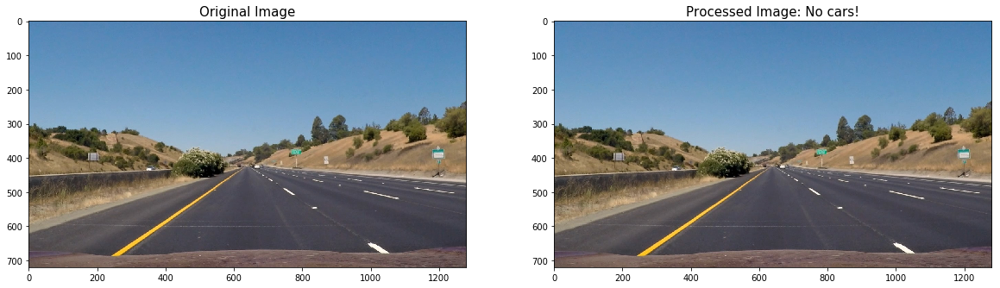

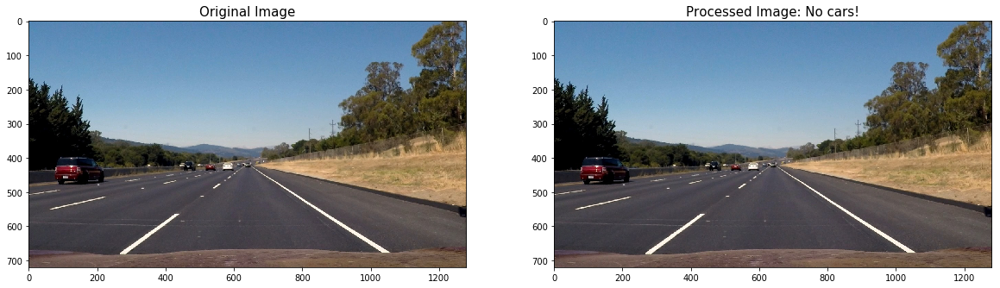

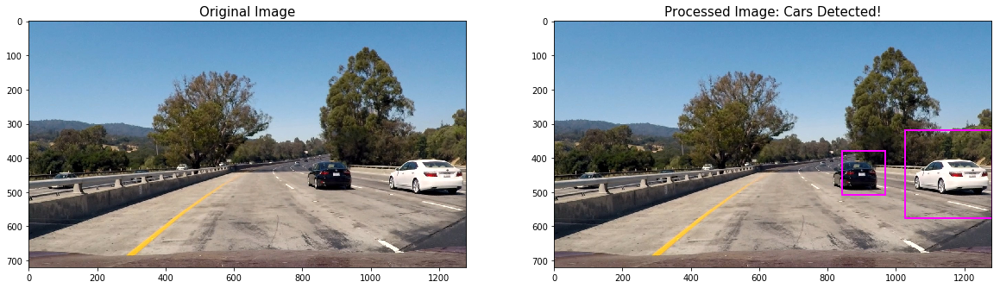

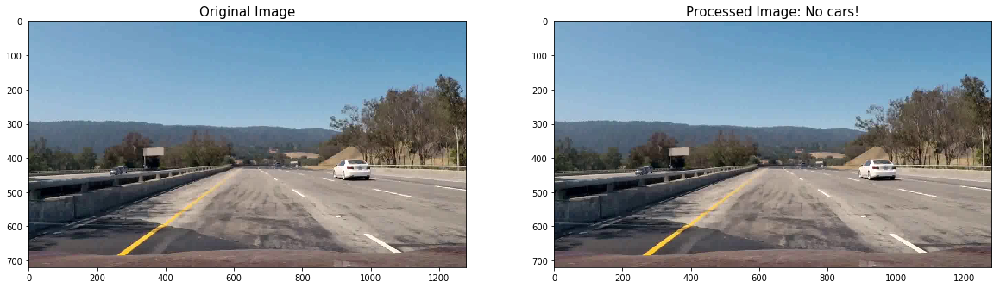

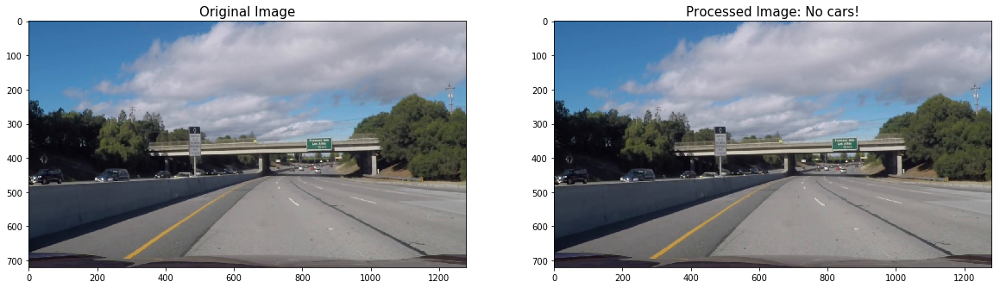

...

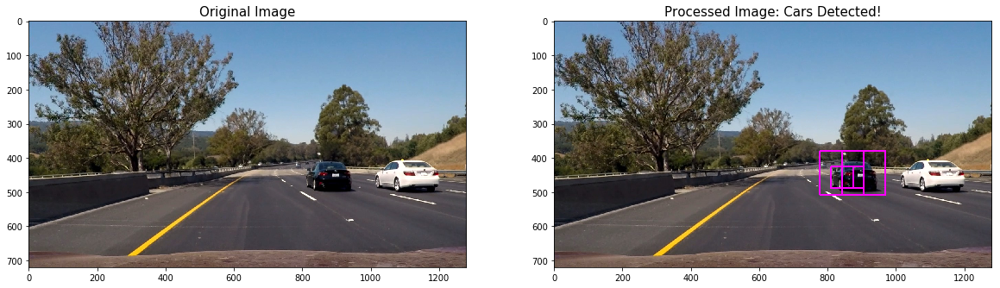

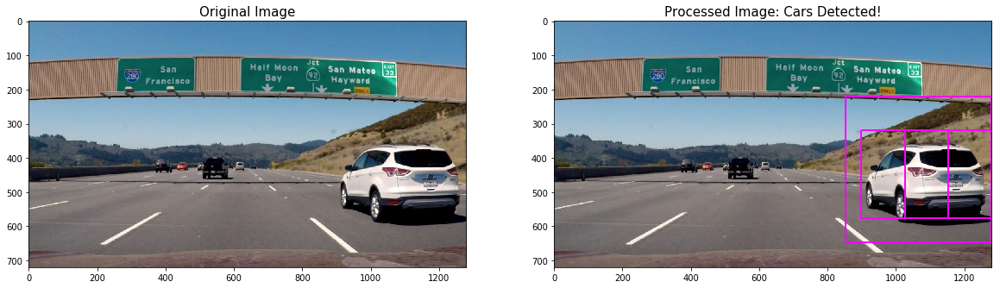

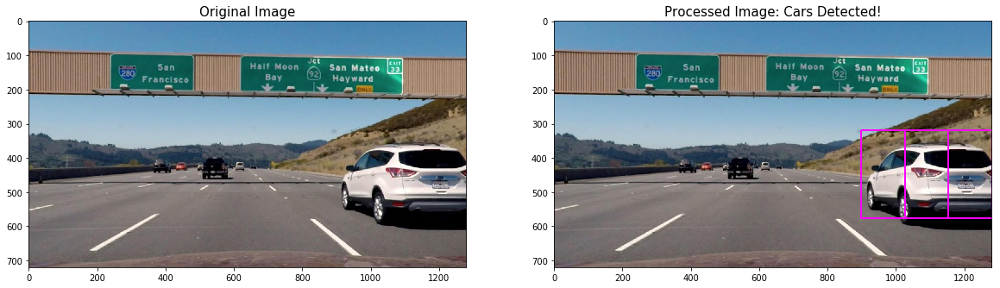

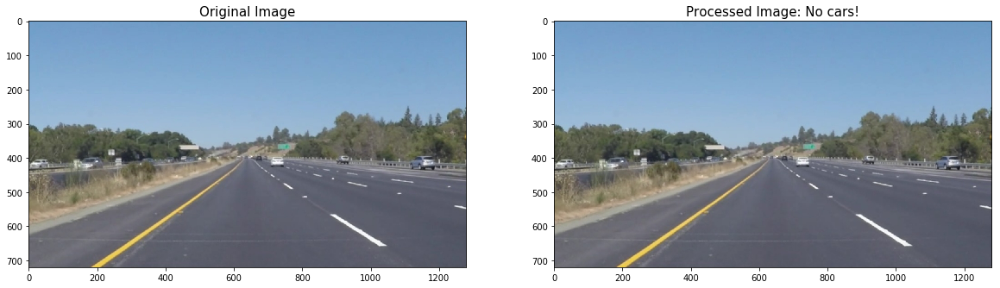

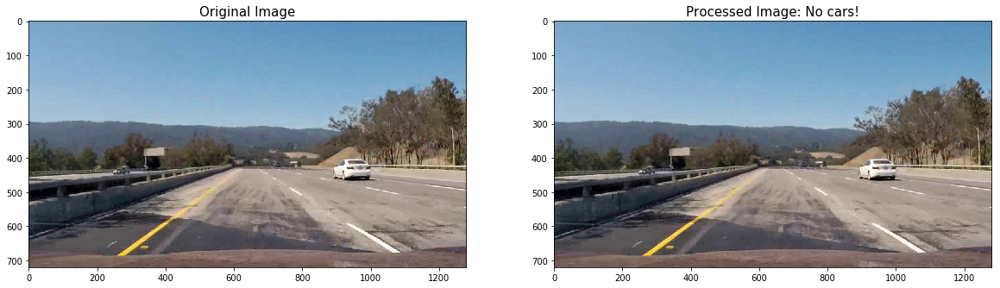

In [58]:
## Build up the Windows

imgShape = [720, 1280]
## We will use the following windows 
# Far-range window: 64x64
# Mid-range1 window: 128x128
# Mid-range2 window: 256x256
# Close-range window: 426x426
windows = []

# Far Range
windows.extend(slide_window(imgShape, x_start_stop=[425, 1000], y_start_stop=[425, 425+64],
                                 xy_window=(64, 64), xy_overlap=(0.5, 0.5)))
# Mid Range 1
windows.extend(slide_window(imgShape, x_start_stop=[200, imgShape[1]-200], y_start_stop=[380, 380+128],
                                 xy_window=(128, 128), xy_overlap=(0.5, 0.5)))
# Mid Range 2
windows.extend(slide_window(imgShape, x_start_stop=[0, imgShape[1]-0], y_start_stop=[320, 320+256],
                                 xy_window=(256, 256), xy_overlap=(0.5, 0.5)))
# Close Range 1
windows.extend(slide_window(imgShape, x_start_stop=[0, imgShape[1]-0], y_start_stop=[220, 220+426],
                                 xy_window=(426, 426), xy_overlap=(0.5, 0.5)))


a_useConfidence=False
a_confidenceThr = 10.0

# 3) And finally I will go through each testing image to search for the “Holy Grail”: Cars! 
# Test images are located here
test_images_path = './test_images/*.jpg'

images = glob.glob(test_images_path)
for file in images: 
    print("processing: ", file)
    t1 = time.time()
    #image = mpimg.imread(file)    
    image = cv2.cvtColor(cv2.imread(file), cv2.COLOR_BGR2RGB)
    
    draw_image = np.copy(image)    
    
    # the following line is due to the fact that I extracted training
    # data from .png images (scaled 0 to 1 by mpimg) and the
    # images I'm searching on are ".jpg" (scaled 0 to 255)
    # image = image.astype(np.float32)/255
    
    hot_windows = search_windows(image, windows, MySVM_Clf, X_scaler, a_color_space,
                                 a_spatial_size, a_hist_bins, a_hist_range, a_orient, 
                                 a_pix_per_cell, a_cell_per_block, a_hog_channel, a_spatial_feat,
                                 a_hist_feat, useConfidence=a_useConfidence, confidenceThr=a_confidenceThr)
    t2 = time.time()
    print('Seconds to process the image:', t2-t1)
    
    window_img = draw_boxes(draw_image, hot_windows, color=(255, 0, 255), thick=3)                    
    # Visualize 
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=15)

    ax2.imshow(window_img)
    if (len(hot_windows)==0):
        ax2.set_title('Processed Image: No cars!', fontsize=15)     
        print("No cars were found on ", file)
    else:
        ax2.set_title('Processed Image: Cars Detected!', fontsize=15)
    
    #whether the image has boxes (cars deteceted) or not, we will save the file for testing purposese below
    hot_window_file = file + '_hotWindows.p'
    pickle.dump( hot_windows, open(hot_window_file , "wb" ) )
    print("Hot Windows Saved ", hot_window_file)

## Hog Sub-sampling Window Search
Now lets explore a more efficient method for doing the sliding window approach, one that allows us to only have to extract the Hog features once. On the lectures we used the code below. The results as you can see are not as good as expected and we need to come up with a better approach

In [60]:
# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, color_space, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    
    draw_img = np.copy(img)
    #img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            colorTrans_image = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            colorTrans_image = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            colorTrans_image = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            colorTrans_image = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            colorTrans_image = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YCrCb)
    else: colorTrans_image = np.copy(img)
    #print('Color Space', color_space)
    
    if scale != 1:
        imshape = colorTrans_image.shape
        colorTrans_image = cv2.resize(colorTrans_image, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = colorTrans_image[:,:,0]
    ch2 = colorTrans_image[:,:,1]
    ch3 = colorTrans_image[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell)-1
    nyblocks = (ch1.shape[0] // pix_per_cell)-1 
    nfeat_per_block = orient*cell_per_block**2
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell)-1 
    cells_per_step = 3  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    #print('Hog1 Shape', hog1.shape)
    boxes_list = []
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            #hog_features = hog_feat1 # Use only Channel 1
            
            
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(colorTrans_image[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            
            
            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            
            # Prediction
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                
                startx = xbox_left
                starty = ytop_draw+ystart
                endx   = xbox_left+win_draw
                endy   = ytop_draw+win_draw+ystart
                
                box = ((startx, starty), (endx, endy))
                
                # Append window position to list
                boxes_list.append(box)
                cv2.rectangle(draw_img,box[0],box[1],(0,0,255),6)
                
    return boxes_list, draw_img

__ Let's test what we did on the lectures but keeping in mind that we will have to use the same parameters we used on the classifier training.__

Loading Model:  ./TrainingResults/rbf_YCrCb_(32, 32)_32_(0, 256)_9_8_2_ALL.pkl
Loading Model Scaler:  ./TrainingResults/Scalers/rbf_YCrCb_(32, 32)_32_(0, 256)_9_8_2_ALL_Scaler.pkl
processing:  ./test_images\straight_lines1.jpg
Hot Windows Saved for:  ./test_images\straight_lines1.jpg_hotWindows2.p
Seconds to process the image: 3.6243624687194824
processing:  ./test_images\straight_lines2.jpg
Hot Windows Saved for:  ./test_images\straight_lines2.jpg_hotWindows2.p
Seconds to process the image: 3.677367687225342
processing:  ./test_images\test1.jpg
Hot Windows Saved for:  ./test_images\test1.jpg_hotWindows2.p
Seconds to process the image: 3.6633663177490234
processing:  ./test_images\test10.jpg
Hot Windows Saved for:  ./test_images\test10.jpg_hotWindows2.p
Seconds to process the image: 3.6643664836883545
processing:  ./test_images\test11.jpg
Hot Windows Saved for:  ./test_images\test11.jpg_hotWindows2.p
Seconds to process the image: 3.6693668365478516
processing:  ./test_images\test12.jpg

C:\Program Files\Miniconda3\envs\carnd-term1\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Hot Windows Saved for:  ./test_images\test8.jpg_hotWindows2.p
Seconds to process the image: 3.640363931655884
processing:  ./test_images\test9.jpg
Hot Windows Saved for:  ./test_images\test9.jpg_hotWindows2.p
Seconds to process the image: 3.7013700008392334


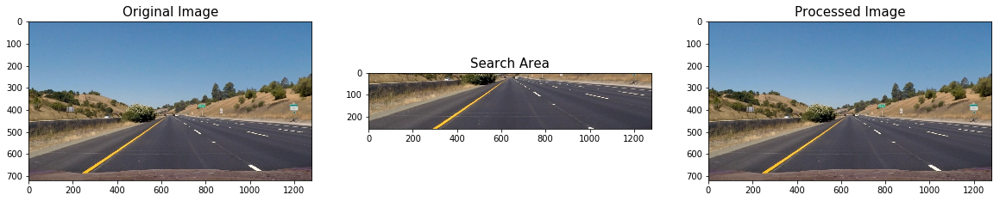

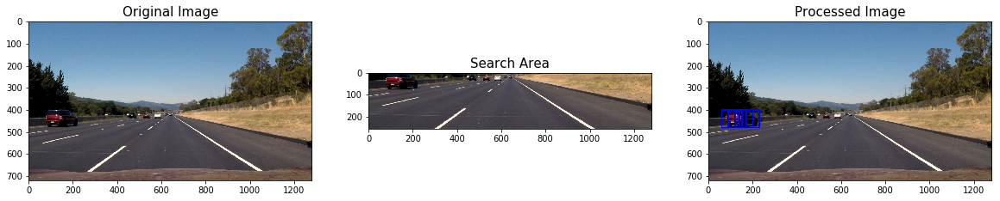

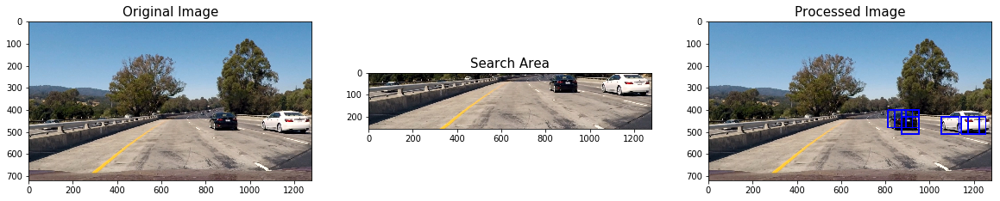

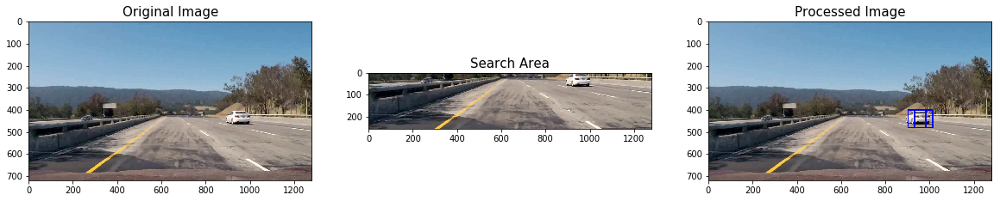

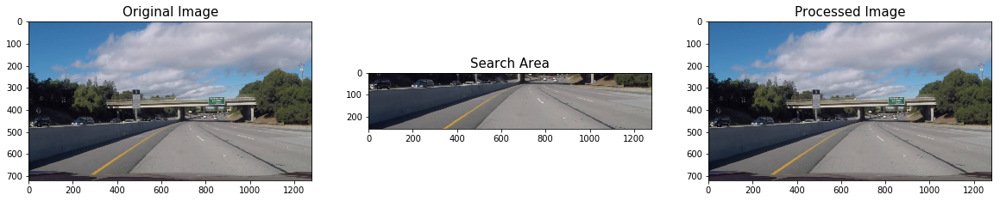

...

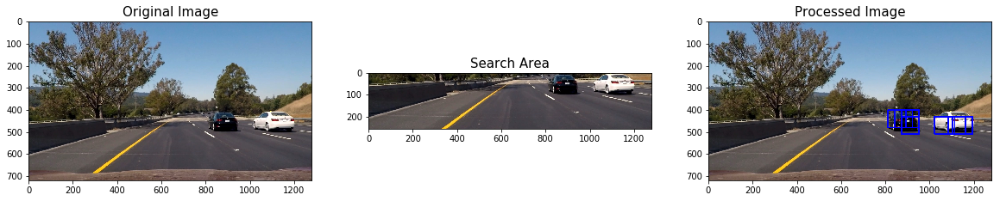

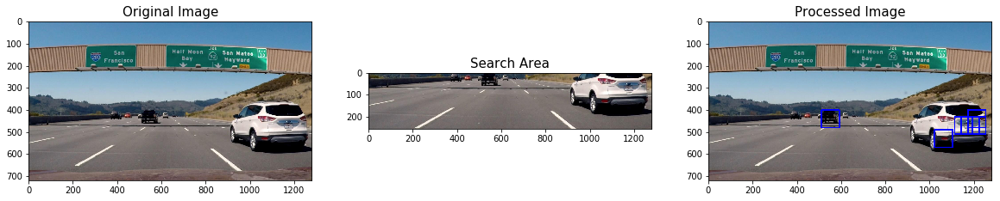

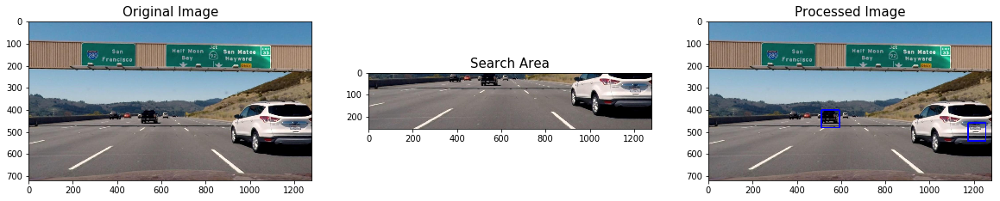

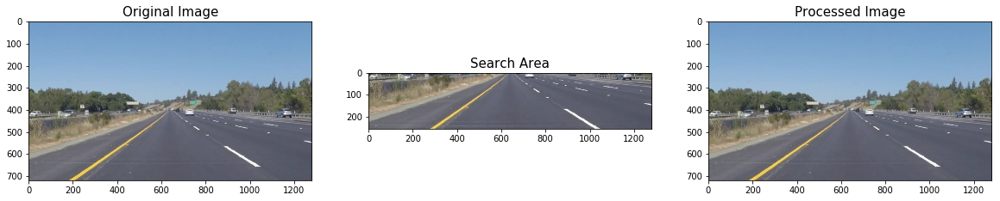

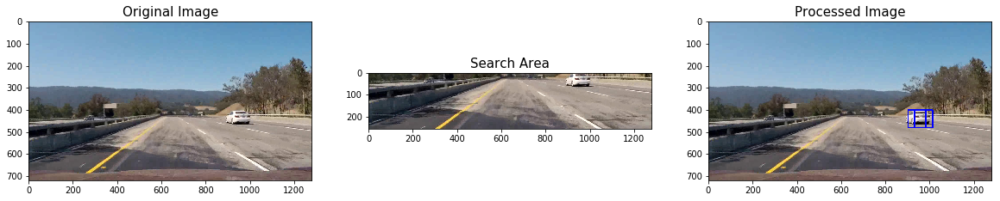

In [61]:
# We did load the Classifier above, but in case we are debugging and just want to run cell...

# Load the trained classifier we are using
print('Loading Model: ', SVM_Model)
MySVM_Clf = joblib.load(SVM_Model)

print('Loading Model Scaler: ', SVM_Model_Scaler)
X_scaler = joblib.load(SVM_Model_Scaler)

# Region of interest for Car searching. I will tune these parameters
ystart = 400
ystop = 656
scale = 1.25

# 3) And finally I will go through each testing image to search for the “Holy Grail”: Cars! 
# Test images are located here
test_images_path = './test_images/*.jpg'

images = glob.glob(test_images_path)
for file in images: 
    print("processing: ", file)
    t1 = time.time()
    #image = mpimg.imread(file)
    image = cv2.cvtColor(cv2.imread(file), cv2.COLOR_BGR2RGB)
    
    hot_windows, out_img = find_cars(image, a_color_space, ystart, ystop, scale, MySVM_Clf, X_scaler, a_orient, a_pix_per_cell, a_cell_per_block,
                        a_spatial_size, a_hist_bins)
    
    # whether the image has boxes (cars deteceted) or not, we will save the file for testing purposese below
    hot_window_file = file + '_hotWindows2.p'
    pickle.dump( hot_windows, open(hot_window_file , "wb" ) )
    print("Hot Windows Saved for: ", hot_window_file)
    
    t2 = time.time()
    print('Seconds to process the image:', t2-t1)
    
    # Visualize
    img_tosearch = image[ystart:ystop,:,:]
    
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=15)
    
    ax2.imshow(img_tosearch)
    ax2.set_title('Search Area', fontsize=15)
    
    ax3.imshow(out_img)
    ax3.set_title('Processed Image', fontsize=15) 
    

## Multiple Detections & False Positives
After trying several "scale" factors, "cells_per_step" and "search area", I finally decided to move on and keep the following configuration:
* scale = 1.25
* cells_per_step = 3
* search area = (ystart = 400, ystop = 656)

Above, I'm showing all the bounding boxes for where my classifier reported positive detections. We can see that overlapping detections exist for many of the vehicles detected, and also we can see that the Classifier performance it's actually outstanding on the test images I'm using. __I have NO false positive detections__, but the testing dataset I'm using is really small and can't assume it will be that good over other images (especially images from the "Harder Video Challenge"). In this next section I'll build a heat-map from these detections in order to combine overlapping detections and remove false positives.

The idea behind a "heat-map" lies simply in adding "heat" (+=1) for all pixels within windows where a positive detection is reported by the classifier. Let's take a look at the code provided in the lectures.


In [62]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

__ Let's test the "Heat Map" functions and their result over the test images. __

processing:  ./test_images\straight_lines1.jpg
processing:  ./test_images\straight_lines2.jpg
processing:  ./test_images\test1.jpg
processing:  ./test_images\test10.jpg
processing:  ./test_images\test11.jpg
processing:  ./test_images\test12.jpg
processing:  ./test_images\test13.jpg
processing:  ./test_images\test14.jpg
processing:  ./test_images\test15.jpg
processing:  ./test_images\test16.jpg
processing:  ./test_images\test17.jpg
processing:  ./test_images\test18.jpg
processing:  ./test_images\test19.jpg
processing:  ./test_images\test2.jpg
processing:  ./test_images\test20.jpg
processing:  ./test_images\test3.jpg
processing:  ./test_images\test4.jpg
processing:  ./test_images\test5.jpg
processing:  ./test_images\test6.jpg
processing:  ./test_images\test7.jpg
processing:  ./test_images\test7_undist.jpg


C:\Program Files\Miniconda3\envs\carnd-term1\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


processing:  ./test_images\test8.jpg
processing:  ./test_images\test9.jpg


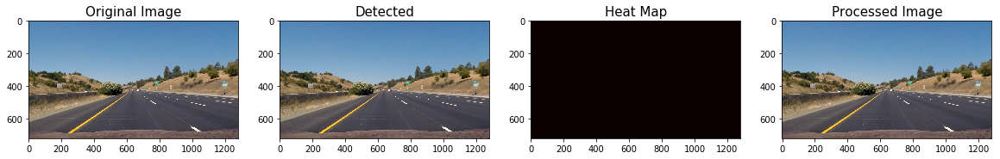

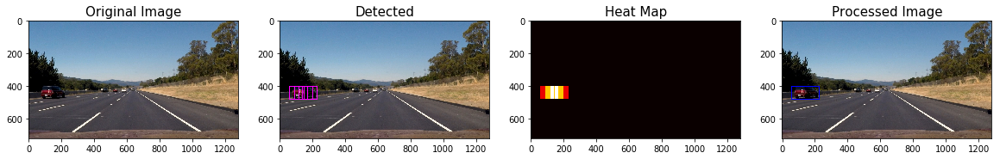

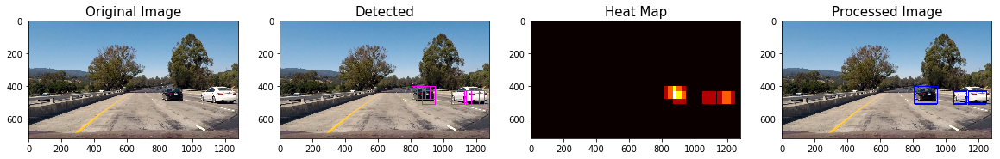

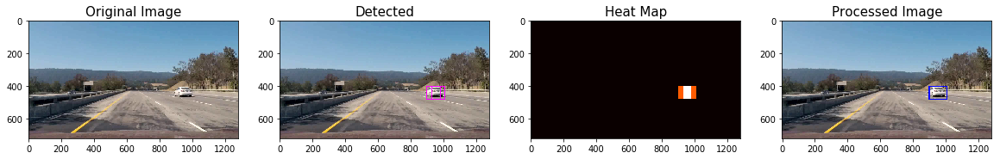

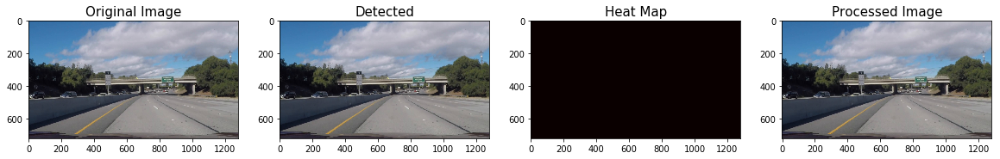

...

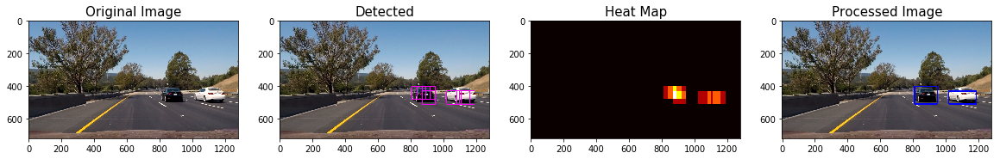

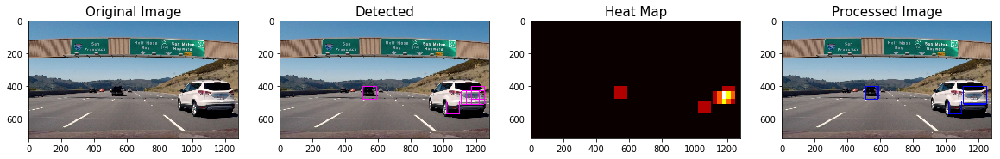

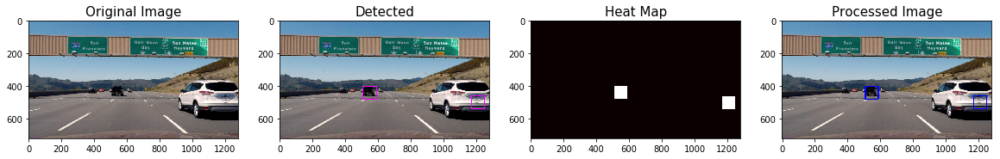

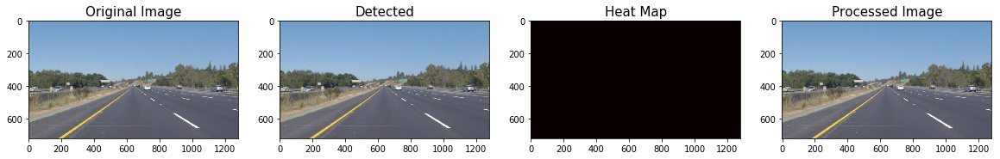

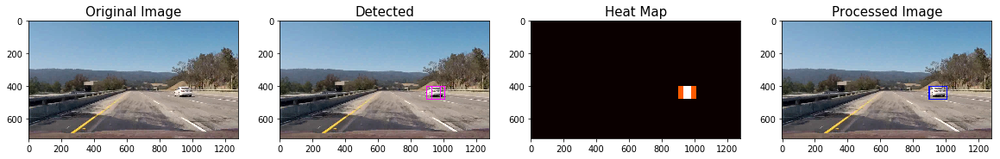

In [64]:
from scipy.ndimage.measurements import label

test_images_path = './test_images/*.jpg'

images = glob.glob(test_images_path)
for file in images: 
    print("processing: ", file)
    t1 = time.time()
    
    # Read in image similar to one shown above 
    #image = mpimg.imread(file)    
    image = cv2.cvtColor(cv2.imread(file), cv2.COLOR_BGR2RGB)
    
    # Read in a pickle file with bboxes saved
    # Each item in the "all_bboxes" list will contain a 
    # list of boxes for one of the images shown above
    box_list = pickle.load( open( file + '_hotWindows2.p', "rb" ))
    
    window_img = draw_boxes(image, box_list, color=(255, 0, 255), thick=3)
    
    heat = np.zeros_like(image[:,:,0]).astype(np.float)

    # Add heat to each box in box list
    heat = add_heat(heat,box_list)

    # Apply threshold to help remove false positives
    threshold = 0.5
    heat = apply_threshold(heat,threshold)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(image), labels)

    # Visualize
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,10))
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=15)
    
    ax2.imshow(window_img)
    ax2.set_title('Detected', fontsize=15)
    
    ax3.imshow(heat, cmap='hot')
    ax3.set_title('Heat Map', fontsize=15)
    
    ax4.imshow(draw_img)
    ax4.set_title('Processed Image', fontsize=15)

__ From the positive detections I created a heatmap and then thresholded that map to identify vehicle positions. I then used scipy.ndimage.measurements.label() to identify individual blobs in the heatmap. I then assumed each blob corresponded to a vehicle. I constructed bounding boxes to cover the area of each blob detected. __

__ I tried several Threshold parameters on these static images and decided to stick with 0.5 to avoid losing the 1 single window detections. Doing so, I will detect the car earlier without the need to wait for multiple windows overlapping. The disadvantage is that I'm risking getting more false positives.__

## Video Implementation

#### 1. In this section I provide a link to the final output videos. 

#### 2. I used the "Heat Map" concept (described above) to implement an oversimplified kind of filter for false positives and for combining overlapping bounding boxes.

#### For smoother results, more time and reseach is recured to "cluster" the overlapping windows and produce a better output image.


In [65]:
## Let's put all together in a "Process_frame" funtion to create the movie
def process_frame(image):
    hot_windows, out_img = find_cars(image, a_color_space, ystart, ystop, scale, MySVM_Clf, X_scaler, a_orient, a_pix_per_cell, a_cell_per_block,
                        a_spatial_size, a_hist_bins)
    
    heat = np.zeros_like(image[:,:,0]).astype(np.float)

    # Add heat to each box in box list
    heat = add_heat(heat,hot_windows)

    # Apply threshold to help remove false positives
    threshold = 0.5
    heat = apply_threshold(heat,threshold)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    processed_img = draw_labeled_bboxes(np.copy(image), labels)
    
    return processed_img

In [ ]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import moviepy as mov

VIDEOS = [ "./videos/project_video_MunirJojoVerge_P4.mp4",
           "./videos/challenge_video_MunirJojoVerge_P4.mp4",
           "./videos/harder_challenge_video_MunirJojoVerge_P4.mp4"]

for video in VIDEOS:
    clip1 = VideoFileClip(video)
    project_clip = clip1.fl_image(process_frame)

    project_output = video[:-4] + '_P5.mp4'
    project_clip.write_videofile(project_output, audio=False)

### Here are the Output Videos
* <a href="./videos/project_video_MunirJojoVerge_P4_P5.mp4">Project Video</a>
* <a href="./videos/challenge_video_MunirJojoVerge_P4_P5.mp4">Challenge Video</a>
* <a href="./videos/harder_challenge_video_MunirJojoVerge_P4_P5.mp4">Harder Challenge Video</a>

## CODE ON PYTHON
__ Apart fron this notebook, I "fused" project 4 and 5 together (Located on the _"LaneVehicleDetector"_ folder) ending up with the following files:__

* __CameraCalibration.py__: Defines the camera class and all its methods to obtain:
    * 1) Camera Matrix used for perfective
    * 2) distortion coefficients
    * 3) rotation vectors
    * 4) Translation vectors
* __ImageProcessingUtils.py__: This file defines ALL the functions described on Project 4 notebook: "Advanced-Lane-Finding-Submission". This functions include: sobel, color thereholding, use Histograms for line fitting, and others to support the lane detection
* __LaneFinder.py__: This file defines the LaneFinder Class and all the methods to support the Lane detetion discussed in class.
    * 1) IsLane: Checks if two lines are likely to form a lane by comparing the curvature and distance.
        Basically are they parallel and if so, is the distance between them a reasonable "Lane size"
    * 2) Draw lane overlay and curvature information, etc..
* __LaneLine.py__: This file defines the LineLane Class that will try to "fit" a line found on the image. I investigated and tried several features to improve the performance of "fitting". Definetely this needs more work but is a good start.
* __PerspectiveTrasformer.py__: This file defines the Perspective Class (properties and methods) exactly as described on Project 4 notebook: "Advanced-Lane-Finding-Submission".
* __ RoadNavigator.py__: This file defines the RoadNavigator class that will simply create an instance on the LaneFinder class and another instance of the VehicleDetector class (below). It also defines a method called "process_frame" that combines the processing done by the Lane detector class and the Vehicle Detector class over each frame of the video
* __ VehicleDetector.py__: This file defines the VehicleDetector class ___(The key class of this assignment)__ with the following methods explained in total detail in this notebook (for more details, please look ath the explanation notes on the file)
    * __init__ (Constructor) that will initialize all the classifier parameters reading from a CSV file that we'll pass into it.
    * get_hog_features: Method to extract the HOG features of a single channel image.
    * bin_spatial: Method to compute binned color features.
    * color_hist: Method to to compute color histogram features.
    * find_cars: Method that can extract all features using hog sub-sampling and make predictions using a "Classifier" that it's loaded with all it's parameters on the class constructor.
    * add_heat, apply_threshold and draw_labeled_bboxes: Methods to aid with the combination of multiple detections and also to get rid of false-positives. 
* __VideoProcessing.py__:This file defines main running function to produce the video outputs we are required to present for this assignment. Goes through all the original videos and proccess them to overlay the detected Lanes and Cars frame-by-frame


## Discussion of problems/issues faced

As mentioned above while going through each step of the process of detecting "Cars", the main challenges faced were:
* A way to quantify how good or bad the feature extraction is or how to tune the feature extraction parameters. The only way to quantify the quality of the image feature extraction and to be able to tune its parameters is to build a "Classifier” and compare their accuracies using different set of features that come from tuning the “extraction” process. The combination of different parameters of the feature extraction functions (Color Space, HOG Feature Channel, Orientation, Pix per Cell and Cell per Block) with having to make a choice of the "Classifier"; plus its parameters makes this "tuning" process a real long and tedious one. 

## What could be improved in the algorithm/pipeline

This work is by no means optimized!! Some of the areas that can definitely be improved are:

* Explore other classifiers, for mainly, faster predictions. My SVN using an rbf kernel had an accuracy of 99.58% which is great but I wanted to try different classifiers: Gaussian Naive Bayes, Decision Trees but mostly interested on CNNs time-performance.
* Also need to research and explore other image-processing techniques for feature extraction. Now-a-days all the techniques we have been exposed to might be the optimal or even the state of the art, but we can’t settle with “ok” and we need to strive for “great”. Humans are great drivers in most adverse conditions and we use, mainly, just a stereo-camera system: Our eyes! The brain does all the heavy lifting but “better” images might definitely help.
* Window search and Hog Sub-sampling Window Search. These methods definitely have lots of room for clever and efficient improvements. They are still computationally very heavy (in my case, around 3.59 secs per image!!!..Totally unacceptable for a real-time application) I'd have loved to explore a more "human-like" object recognition method. The literature on the Cognitive neuroscience of visual object recognition topic is vast and captivating.
* The smooth tracking, multiple detections & false positives is another are open for improvements. Heat and thresholds are a great start but as I mentioned above, time-critical applications that also require robustness and extremely safe contingency responses shout for way more research in these areas.
* Obviously, since all the information we have comes from “images”, testing for higher resolution video, wider angle, etc..might allow us to explore other venues that could include “detection and Classification” using bird-eye view (since we are using it for lane detection). We have to admit that most of the techniques that we come up with are always based on “Human-like” approach. Maybe we can recognize cars looking at their heat signature by capturing images on infrared, for instance. My point being, that road have been constructed for humans and for their limited sensory systems..but we are not limited to these systems or to their bandwidths to define and design the roads, cars and self-driving techniques of the future.
* I would have loved to explore a more elegant way to represent/label the detected cars. Some gaming techniques and tools would have been a fun place to start.


## What hypothetical cases would cause this approach to fail.

I haven't tested these algorithms outside the 3 videos provided so I have only identified 2 main issues:
* The relative speed of the other vehicles plays an important role. On the “Harder” video we can see that close cars coming at us at a speed that will not allow for enough frames to be detected is a challenge.
* It’s also clear that glare on the windshield, and light conditions are proving to be a challenge for the system as well as for the human drivers (me looking at the screen and having a hard time identifying the coming cars for a few milliseconds until I see other areas of motion).
* An obviously, any of these techniques are NOT acceptable for real-time projects. As I mentioned before, it takes about 3.6 seconds per image to apply detection!! That made the video processing very long! (2.88 min processing per 1sec video (48 fps) )

## In Conclusion

This has been a great project. Great learning experience!!